## Assignment : 14

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


<pre>
1. Download the preprocessed DonorsChoose data from here <a href='https://drive.google.com/file/d/1GU3LIJJ3zS1xLXXe-sdItSJHtI5txjVO/view?usp=sharing'>Dataset</a>
2. Split the data into train, cv, and test
3. After step 2 you have to train 3 types of models as discussed below. 
4. For all the model use <a href='https://scikit-learn.org/stable/modules/model_evaluation.html#roc-metrics'>'auc'</a> as a metric. check <a href='https://datascience.stackexchange.com/a/20192'>this</a> for using auc as a metric. you need to print the AUC value for each epoch. Note: you should NOT use the tf.metric.auc
5. You are free to choose any number of layers/hiddden units but you have to use same type of architectures shown below. 
6. You can use any one of the optimizers and choice of Learning rate and momentum, resources: <a href='http://cs231n.github.io/neural-networks-3/'>cs231n class notes</a>, <a href='https://www.youtube.com/watch?v=hd_KFJ5ktUc'>cs231n class video</a>. 
7. You should Save the best model weights.
8. For all the model's use <a href='https://www.youtube.com/watch?v=2U6Jl7oqRkM'>TensorBoard</a> and plot the Metric value and Loss with epoch. While submitting, take a screenshot of plots and include those images in .ipynb notebook and PDF. 
9. Use Categorical Cross Entropy as Loss to minimize.
10. try to get AUC more than 0.8 for atleast one model
</pre>

### Model-1

Build and Train deep neural network as shown below

<img src='https://i.imgur.com/w395Yk9.png'>
ref: https://i.imgur.com/w395Yk9.png

- __Input_seq_total_text_data__ --- You have to give Total text data columns. After this use the Embedding layer to get word vectors. Use given predefined glove word vectors, don't train any word vectors. After this use LSTM and get the LSTM output and Flatten that output. 
- __Input_school_state__ --- Give 'school_state' column as input to embedding layer and Train the Keras Embedding layer. 
- __Project_grade_category__  --- Give 'project_grade_category' column as input to embedding layer and Train the Keras Embedding layer.
- __Input_clean_categories__ --- Give 'input_clean_categories' column as input to embedding layer and Train the Keras Embedding layer.
- __Input_clean_subcategories__ --- Give 'input_clean_subcategories' column as input to embedding layer and Train the Keras Embedding layer.
- __Input_clean_subcategories__ --- Give 'input_teacher_prefix' column as input to embedding layer and Train the Keras Embedding layer.
- __Input_remaining_teacher_number_of_previously_posted_projects._resource_summary_contains_numerical_digits._price._quantity__ ---concatenate remaining columns and add a Dense layer after that. 



- For LSTM, you can choose your sequence padding methods on your own or you can train your LSTM without padding, there is no restriction on that.

Below is an example of embedding layer for a categorical columns. In below code all are dummy values, we gave only for referance. 

In [0]:
# https://stats.stackexchange.com/questions/270546/how-does-keras-embedding-layer-work
input_layer = Input(shape=(n,))
embedding = Embedding(no_1, no_2, input_length=n)(input_layer)
flatten = Flatten()(embedding)

### 1. Go through this blog, if you have any doubt on using predefined Embedding values in Embedding layer - https://machinelearningmastery.com/use-word-embedding-layers-deep-learning-keras/
### 2. Please go through this link https://keras.io/getting-started/functional-api-guide/ and check the 'Multi-input and multi-output models' then you will get to know how to give multiple inputs. 

In [0]:
# importing required libraries
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
from keras.layers import Input, Embedding, LSTM, Dropout, BatchNormalization, Dense, concatenate, Flatten, Conv1D, MaxPool1D, LeakyReLU, ELU, SpatialDropout1D, MaxPooling1D, GlobalAveragePooling1D, GlobalMaxPooling1D
from keras.preprocessing.text import Tokenizer, one_hot
from keras.preprocessing.sequence import pad_sequences
from keras.models import Model, load_model
from keras import regularizers
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard, ReduceLROnPlateau
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics import roc_auc_score
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
import re
from tqdm import tqdm
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import pickle

Using TensorFlow backend.


In [0]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm_notebook as tqdm1
from tqdm import tqdm
import time
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

from sklearn.model_selection import train_test_split

In [0]:
# project_data = pd.read_csv('preprocessed_data.csv')
# project_data.head()

In [0]:
# project_data = pd.read_csv('train_data.csv', nrows=50000)
project_data = pd.read_csv('/content/drive/My Drive/AAIC/Assignments/train_data.csv')
resource_data = pd.read_csv('/content/drive/My Drive/AAIC/Assignments/resources.csv')

In [0]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (109248, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


## Text preprocessing(1)

In [0]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())

In [0]:
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)
project_data.head(5)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,"Civics & Government, Team Sports",Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms.,AZ,2016-08-31 12:03:56,Grades 6-8,"Health & Wellness, Team Sports",Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,NaN,NaN,"My students need shine guards, athletic socks,...",1,0,Health_Sports
3,45,p246581,f3cb9bffbba169bef1a77b243e620b60,Mrs.,KY,2016-10-06 21:16:17,Grades PreK-2,"Literacy, Mathematics",Techie Kindergarteners,I work at a unique school filled with both ESL...,My students live in high poverty conditions wi...,NaN,NaN,My students need to engage in Reading and Math...,4,1,Literacy_Language Math_Science
4,172407,p104768,be1f7507a41f8479dc06f047086a39ec,Mrs.,TX,2016-07-11 01:10:09,Grades PreK-2,Mathematics,Interactive Math Tools,Our second grade classroom next year will be m...,"For many students, math is a subject that does...",NaN,NaN,My students need hands on practice in mathemat...,1,1,Math_Science


In [0]:

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())
my_counter

Counter({'AppliedLearning': 12135,
         'Care_Hunger': 1388,
         'Health_Sports': 14223,
         'History_Civics': 5914,
         'Literacy_Language': 52239,
         'Math_Science': 41421,
         'Music_Arts': 10293,
         'SpecialNeeds': 13642,
         'Warmth': 1388})

In [0]:
# dict sort by value python: https://stackoverflow.com/a/613218/4084039
cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


# ind = np.arange(len(sorted_cat_dict))
# plt.figure(figsize=(20,5))
# p1 = plt.bar(ind, list(sorted_cat_dict.values()))

# plt.ylabel('Projects')
# plt.title('% of projects aproved category wise')
# plt.xticks(ind, list(sorted_cat_dict.keys()))
# plt.show()
# print(sorted_cat_dict)

In [0]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

In [0]:
project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports


In [0]:
# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
from collections import Counter
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())

In [0]:
# dict sort by value python: https://stackoverflow.com/a/613218/4084039
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))


# ind = np.arange(len(sorted_sub_cat_dict))
# plt.figure(figsize=(20,5))
# p1 = plt.bar(ind, list(sorted_sub_cat_dict.values()))

# plt.ylabel('Projects')
# plt.title('% of projects aproved state wise')
# plt.xticks(ind, list(sorted_sub_cat_dict.keys()))
# plt.show()

In [0]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [0]:
# https://stackoverflow.com/questions/22407798/how-to-reset-a-dataframes-indexes-for-all-groups-in-one-step
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
price_data.head(2)

,id,price,quantity
0,p000001,459.56,7
1,p000002,515.89,21


In [0]:
# join two dataframes in python: 
project_data = pd.merge(project_data, price_data, on='id', how='left')

In [0]:
#presence of the numerical digits in a strings with numeric : https://stackoverflow.com/a/19859308/8089731
def hasNumbers(inputString):
    return any(i.isdigit() for i in inputString)
p1 = project_data[['id','project_resource_summary']]
p1 = pd.DataFrame(data=p1)
p1.columns = ['id','digits_in_summary']
p1['digits_in_summary'] =  p1['digits_in_summary'].map(hasNumbers)
# https://stackoverflow.com/a/17383325/8089731
p1['digits_in_summary'] = p1['digits_in_summary'].astype(int)
project_data = pd.merge(project_data, p1, on='id', how='left')
project_data.head(5)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...,154.60,23,0
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...,299.00,1,0
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms.,AZ,2016-08-31 12:03:56,Grades 6-8,Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,NaN,NaN,"My students need shine guards, athletic socks,...",1,0,Health_Sports,Health_Wellness TeamSports,"\r\n\""True champions aren't always the ones th...",516.85,22,0
3,45,p246581,f3cb9bffbba169bef1a77b243e620b60,Mrs.,KY,2016-10-06 21:16:17,Grades PreK-2,Techie Kindergarteners,I work at a unique school filled with both ESL...,My students live in high poverty conditions wi...,NaN,NaN,My students need to engage in Reading and Math...,4,1,Literacy_Language Math_Science,Literacy Mathematics,I work at a unique school filled with both ESL...,232.90,4,0
4,172407,p104768,be1f7507a41f8479dc06f047086a39ec,Mrs.,TX,2016-07-11 01:10:09,Grades PreK-2,Interactive Math Tools,Our second grade classroom next year will be m...,"For many students, math is a subject that does...",NaN,NaN,My students need hands on practice in mathemat...,1,1,Math_Science,Mathematics,Our second grade classroom next year will be m...,67.98,4,0


## Text preprocessing(2)

In [0]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [0]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [0]:
# Combining all the above statemennts 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm1(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    sent = re.sub('nannan', '', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

In [0]:
from tqdm import tqdm
preprocessed_titles = []
# tqdm is for printing the status bar
for title in tqdm1(project_data['project_title'].values):
    _title = decontracted(title)
    _title = _title.replace('\\r', ' ')
    _title = _title.replace('\\"', ' ')
    _title = _title.replace('\\n', ' ')
    _title = re.sub('[^A-Za-z0-9]+', ' ', _title)
    # https://gist.github.com/sebleier/554280
    _title = ' '.join(e for e in _title.split() if e not in stopwords)
    preprocessed_titles.append(_title.lower().strip())

In [0]:
preprocessed_titles[1000]

'sailing into super 4th grade year'

In [0]:
project_grade_catogories = list(project_data['project_grade_category'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

project_grade_cat_list = []
for i in tqdm1(project_grade_catogories):
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    project_grade_cat_list.append(temp.strip())

In [0]:
project_data['clean_project_grade_category'] = project_grade_cat_list
project_data.drop(['project_grade_category'], axis=1, inplace=True)
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary,clean_project_grade_category
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...,154.6,23,0,GradesPreK-2
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...,299.0,1,0,Grades6-8


In [0]:
project_data.drop(['project_essay_1','project_essay_2','project_essay_3','project_essay_4'], axis=1, inplace=True)
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary,clean_project_grade_category
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Educational Support for English Learners at Home,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...,154.6,23,0,GradesPreK-2
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Wanted: Projector for Hungry Learners,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...,299.0,1,0,Grades6-8


In [0]:
#Replacing Nan's with maximum occured value: https://stackoverflow.com/a/51053916/8089731
project_data['teacher_prefix'].value_counts().argmax()
project_data.fillna(value=project_data['teacher_prefix'].value_counts().argmax(),axis=1,inplace=True)

In [0]:
project_data['preprocessed_essays'] = preprocessed_essays
project_data['preprocessed_titles'] = preprocessed_titles

In [0]:
X_train, X_test, y_train, y_test = train_test_split(project_data,project_data['project_is_approved'], test_size=0.33, stratify = project_data['project_is_approved'])
# X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train)

X_train.drop(['project_is_approved'], axis=1, inplace=True)
X_test.drop(['project_is_approved'], axis=1, inplace=True)
# X_cv.drop(['project_is_approved'], axis=1, inplace=True)
print(X_train.shape)
print(X_test.shape)

(73196, 18)
(36052, 18)


In [0]:
X_train

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_resource_summary,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary,clean_project_grade_category,preprocessed_essays,preprocessed_titles
74816,66347,p096461,17b3e30cc4663cbf3e30096644e9e825,Mr.,CO,2017-01-26 17:02:13,Pump It Up!,My students need fitness bands to increase the...,1,Health_Sports,Gym_Fitness Health_Wellness,"My students are cheerful, outgoing, competitiv...",239.75,3,0,Grades3-5,my students cheerful outgoing competitive frie...,pump it up
99412,36847,p097485,cf7a3bbb1e42e478156b38ba970ff9a1,Mrs.,NC,2017-01-02 20:17:15,CHROME Classroom,My students need 2 Chromebooks to enhance thei...,99,History_Civics Literacy_Language,History_Geography Literacy,I teach reading and social studies to 75 fifth...,164.99,2,1,Grades3-5,i teach reading social studies 75 fifth grader...,chrome classroom
21814,65679,p173394,00c14809f1ee207e4e5c0ee26fc50357,Mr.,IL,2016-08-11 12:45:37,Bring Our Classroom into the 21st Century,My students need resources that can be used to...,2,Literacy_Language Math_Science,Literacy Mathematics,My school is located on the Northwest side of ...,399.99,4,1,Grades3-5,my school located northwest side chicago commu...,bring our classroom 21st century
9966,130421,p214011,9c55cc54ff0b38ce69959b3d22f206ef,Ms.,CA,2016-11-11 20:42:48,"Levers, Logic, and Lift--Lego Simple Machines ...","My students need highly engaging, hands-on mat...",0,Math_Science,AppliedSciences EnvironmentalScience,"We are an active bunch--hands-on, deep-thinkin...",169.95,4,0,GradesPreK-2,we active bunch hands deep thinking creative f...,levers logic lift lego simple machines get us ...
72147,90182,p190966,1f8ad9e87a1f3fe9eb6315044005a5e4,Mr.,OR,2016-06-15 17:09:18,Drums for Our Music Classroom,My students need six more tubanos for our musi...,3,Music_Arts,Music,Music is the great equalizer in school. Those ...,419.99,2,0,Grades3-5,music great equalizer school those may not suc...,drums our music classroom
49595,129996,p231073,9a001dad8acf41cb0c8a6fef21725192,Mr.,PA,2016-09-09 17:43:30,Chromebooks for the Future Part 3,My students need chromebooks to access the dig...,7,Literacy_Language Math_Science,Literacy Mathematics,Many of my students are living in poverty and ...,174.85,3,0,GradesPreK-2,many students living poverty find great deal c...,chromebooks future part 3
18802,170442,p172041,1dd06f59bbcd099b23d6df4fbf7c9ce1,Mrs.,NY,2016-08-15 16:48:09,Alternative Seating to Enhance Learning,"My students need alternative seating, such as ...",9,Health_Sports,Health_Wellness,Our district is located in a small town in the...,605.35,15,0,Grades3-5,our district located small town northeast part...,alternative seating enhance learning
82561,53923,p197065,1cf9bf227b6219273db2ab8ef504ae96,Ms.,MO,2017-04-19 14:28:20,Little Learners and Big Ideas!,My students need a variety of materials to uti...,1,Math_Science,Health_LifeScience,The students in my pre-k class are young and v...,785.97,4,0,GradesPreK-2,the students pre k class young eager they come...,little learners big ideas
6617,113020,p124227,eca2679f485b276396e09a671d817965,Mrs.,FL,2017-03-01 18:31:42,"We Like to MOVE it, MOVE it!",My students need to be able to be KIDS and MOVE!,11,Literacy_Language Math_Science,Literature_Writing Mathematics,I recently got back into the classroom after a...,357.88,22,0,Grades3-5,i recently got back classroom brief stint lead...,we like move move
71003,102357,p011167,b86b594e8cc5fe325ec88fad97722b32,Ms.,TX,2016-07-12 21:25:14,Flexible Seating For All!,My students need a Low Rainbow Rectangular Tab...,88,Literacy_Language Math_Science,Literacy Mathematics,My Kindergarten students are eager learners wh...,208.99,7,1,GradesPreK-2,my kindergarten students eager learners attend...,flexible seating for all


In [0]:
import dill 
# dill.dump_session('notebook_envall.db') 
dill.load_session('notebook_envall.db')

Using TensorFlow backend.


In [0]:
from numpy import array
from numpy import asarray
from numpy import zeros
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Embedding 

In [0]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X_train["essay"].tolist())
seq_train = tokenizer.texts_to_sequences(X_train["essay"])
seq_test = tokenizer.texts_to_sequences(X_test["essay"])

In [0]:
vocab_size = len(tokenizer.word_index) + 1

In [0]:
padded_train = pad_sequences(seq_train,maxlen=800,padding='post', truncating='post')
padded_test = pad_sequences(seq_test, maxlen=800,padding='post', truncating='post')

In [0]:
pickle_in = open("/content/drive/My Drive/AAIC/Assignments/glove_vectors","rb")
glove_words = pickle.load(pickle_in)

In [0]:
embedding_matrix = zeros((vocab_size, 300))
for word, i in tokenizer.word_index.items():
    embedding_vector = glove_words.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

In [0]:
# input_text = Input(shape=(800,),name="input_text")
embedding_layer = Embedding(vocab_size,300,weights=[embedding_matrix],input_length=800,trainable=False)
input_text = Input(shape=(800,),name="input_text")
x = embedding_layer(input_text)
x = LSTM(128,recurrent_dropout=0.5,kernel_regularizer=regularizers.l2(0.001),return_sequences=True)(x)
flat_1 = Flatten()(x)






Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [0]:
# Teacher Prefix
no_of_unique_prefix  = X_train["teacher_prefix"].nunique()
embed_size_prefix = int(min(np.ceil((no_of_unique_prefix)/2), 50 ))

input_prefix = Input(shape=(1,),name="teacher_prefix")
embed_prefix = Embedding(no_of_unique_prefix,embed_size_prefix,trainable=True)(input_prefix)
flat_2 = Flatten()(embed_prefix)
lab_enc = LabelEncoder()
enc_prefix_train = lab_enc.fit_transform(X_train["teacher_prefix"])
X_test["teacher_prefix"] = X_test["teacher_prefix"].map(lambda s: ' ' if s not in lab_enc.classes_ else s)
lab_enc.classes_ = np.append(lab_enc.classes_, ' ')
enc_prefix_test = lab_enc.transform(X_test["teacher_prefix"])

In [0]:
# School State
no_of_unique_state  = X_train["school_state"].nunique()
embed_size_state= int(min(np.ceil((no_of_unique_state)/2), 50 ))

input_state = Input(shape=(1,),name="school_prefix")
embed_state = Embedding(no_of_unique_state,embed_size_state,name="emb_state",trainable=True)(input_state)
flat_3 = Flatten()(embed_state)
enc_state_train = lab_enc.fit_transform(X_train["school_state"])
enc_state_test = lab_enc.transform(X_test["school_state"])

In [0]:
X_train

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_resource_summary,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary,clean_project_grade_category,preprocessed_essays,preprocessed_titles
61692,9233,p134729,2fba990f30bae627a30c12abc14b4ef8,Mrs.,LA,2016-09-24 15:42:06,Going for the Chrome... 2016!!,My students need 2 Chromebooks to help meet th...,2,AppliedLearning Math_Science,College_CareerPrep Mathematics,Gone are the days of printing worksheet after ...,249.00,2,1,Grades3-5,gone days printing worksheet worksheet in era ...,going chrome 2016
101374,30334,p190416,b62d6e4ad22c5fcc2063d3eb99713627,Ms.,NY,2017-02-26 19:38:33,"Bringing the Script to Life; Props, Costumes, ...",My students need costume pieces and props to b...,6,Music_Arts,PerformingArts,My students are the actors of Riverhead Charte...,351.70,58,0,Grades6-8,my students actors riverhead charter school al...,bringing script life props costumes set design
8708,89772,p149606,b642d19bb72bc81afe90784121562e92,Ms.,NM,2016-08-26 20:01:06,Chrometastic Oppertunity!,My students need Chromebooks in order to acces...,29,SpecialNeeds,SpecialNeeds,"My students consist of 12 kindergarten, first,...",167.99,3,1,GradesPreK-2,my students consist 12 kindergarten first seco...,chrometastic oppertunity
70173,6607,p009634,c751cdc864bdc94a7c73fbc8d81f6260,Ms.,LA,2016-08-25 20:11:56,Flood DSJH with Love,My students need CALCULATORS to help them navi...,2,Math_Science,Mathematics,"My students are hardworking, selfless \""little...",115.99,3,0,Grades6-8,my students hardworking selfless little people...,flood dsjh love
90839,144635,p000962,413dd95145e3bc9940e70f7dcf1c6304,Mr.,AZ,2016-05-23 13:14:02,Supplies for the Perfect Sound,My students need instrument basic such as: ree...,0,Music_Arts,Music,Everyday is music to my hears when my students...,251.77,46,0,Grades6-8,everyday music hears students get chance play ...,supplies perfect sound
62631,78012,p212397,53ccd40b8bd6f268ab7a0c73be3c0128,Mrs.,TX,2016-09-14 13:10:23,The More You Read the More You Know!,My students need books and supplies for an eff...,0,Literacy_Language,Literacy,"My intervention classroom is full of fun, hand...",419.74,17,0,Grades3-5,my intervention classroom full fun hands chall...,the more you read more you know
41361,50382,p237295,50e93b8c452382361a4847f4bb3acf24,Mrs.,MI,2016-09-23 14:25:05,Books for Low Income Toddlers with Special Needs,My students need books to read at home with th...,4,SpecialNeeds,SpecialNeeds,Early Childhood Special Education teachers spe...,150.90,36,0,GradesPreK-2,early childhood special education teachers spe...,books low income toddlers special needs
97600,28582,p136590,c0432ba8cc235436596dd1e9184ca59d,Mr.,CO,2016-09-20 15:03:21,Everyday art supplies.,"My students need watercolor paper, markers, pa...",0,Music_Arts,VisualArts,My students absolutely love art. Each day they...,226.95,28,0,Grades3-5,my students absolutely love art each day walk ...,everyday art supplies
67695,85668,p204009,c9fd190fc4673e37fdfd919816f8fb34,Ms.,CA,2016-12-29 00:57:50,Robots Are Taking Over Our Classroom!,My students need Wonder Workshop robots so the...,10,Math_Science,AppliedSciences Mathematics,"My students are eager, hardworking 1st graders...",279.99,1,0,GradesPreK-2,my students eager hardworking 1st graders fill...,robots are taking over our classroom
62517,177330,p039526,aa96ef933643e81d26495f0cbaea40aa,Ms.,MI,2016-09-04 22:40:27,We Are Going to Have a Ball!,"My students need basketballs, soccer balls, an...",3,Health_Sports,Gym_Fitness TeamSports,"In my 3rd grade class, I have 12 children who ...",160.46,11,0,Grades3-5,in 3rd grade class i 12 children speak differe...,we are going have ball


In [0]:
#project_grade_category
no_of_unique_grade  = X_train["clean_project_grade_category"].nunique()
embed_size_grade = int(min(np.ceil((no_of_unique_grade)/2), 50 ))

input_grade= Input(shape=(1,),name="grade_cat")
embed_grade = Embedding(no_of_unique_grade,embed_size_grade,name="emb_grade",trainable=True)(input_grade)
flat_4 = Flatten()(embed_grade)
enc_grade_train = lab_enc.fit_transform(X_train["clean_project_grade_category"])
enc_grade_test = lab_enc.transform(X_test["clean_project_grade_category"])

In [0]:
#project_subject_categories
no_of_unique_subcat  = X_train["clean_categories"].nunique()
embed_size_subcat = int(min(np.ceil((no_of_unique_subcat)/2), 50 ))

input_subcat= Input(shape=(1,),name="sub_cat")
embed_subcat = Embedding(no_of_unique_subcat,embed_size_subcat,name="emb_subcat",trainable=True)(input_subcat)
flat_5 = Flatten()(embed_subcat)
lab_enc = LabelEncoder()
enc_subcat_train = lab_enc.fit_transform(X_train["clean_categories"])
X_test["clean_categories"] = X_test["clean_categories"].map(lambda s: ' ' if s not in lab_enc.classes_ else s)
lab_enc.classes_ = np.append(lab_enc.classes_, ' ')
enc_subcat_test= lab_enc.transform(X_test["clean_categories"])

In [0]:
#project_subject_subcategories
no_of_unique_subcat_1  = X_train["clean_subcategories"].nunique()
embed_size_subcat_1 = int(min(np.ceil((no_of_unique_subcat_1)/2), 50 ))

input_subcat_1= Input(shape=(1,),name="sub_cat_1")
embedding_subcat_1 = Embedding(no_of_unique_subcat_1,embed_size_subcat_1,name="emb_subcat_1",trainable=True)(input_subcat_1)
flat_6 = Flatten()(embedding_subcat_1)
lab_enc = LabelEncoder()
enc_subcat_1_train = lab_enc.fit_transform(X_train["clean_subcategories"])
X_test["clean_subcategories"] = X_test["clean_subcategories"].map(lambda s: ' ' if s not in lab_enc.classes_ else s)
lab_enc.classes_ = np.append(lab_enc.classes_, ' ')
enc_subcat_1_test= lab_enc.transform(X_test["clean_subcategories"])

In [0]:
numerical_train_a=X_train['digits_in_summary'].values.reshape(-1, 1)
numerical_train_b=X_train['price'].values.reshape(-1, 1)
numerical_train_c=X_train['quantity'].values.reshape(-1, 1)
numerical_train_d=X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1)
numerical_test_a=X_test['digits_in_summary'].values.reshape(-1, 1)
numerical_test_b=X_test['price'].values.reshape(-1, 1)
numerical_test_c=X_test['quantity'].values.reshape(-1, 1)
numerical_test_d=X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1)
numerical_train=np.concatenate((numerical_train_a,numerical_train_b,numerical_train_c,numerical_train_d),axis=1)
numerical_test=np.concatenate((numerical_test_a,numerical_test_b,numerical_test_c,numerical_test_d),axis=1)

from sklearn.preprocessing import StandardScaler
normal=StandardScaler()
normal_train=normal.fit_transform(numerical_train)
normal_test=normal.transform(numerical_test)

In [0]:
numerical_feats = Input(shape=(4,),name="numerical_features")
numerical_featss = Dense(100,activation="relu",kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(numerical_feats)

In [0]:
x = concatenate([flat_1,flat_2,flat_3,flat_4,flat_5,flat_6,numerical_featss])
x = Dense(128,activation="relu", kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(x)
x=Dropout(0.5)(x)
x = Dense(256,activation="relu",kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(x)
x=Dropout(0.5)(x)
x = Dense(64,activation="relu", kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(x)
x = BatchNormalization()(x)
output = Dense(2, activation='softmax', name='output')(x)
model_1 = Model(inputs=[input_text,input_prefix,input_state,input_grade,input_subcat,input_subcat_1,numerical_feats],outputs=[output])

In [0]:
train_data_1 = [padded_train,enc_prefix_train,enc_state_train,enc_grade_train,enc_subcat_train,enc_subcat_1_train,normal_train]
test_data_1 = [padded_test,enc_prefix_test,enc_state_test,enc_grade_test,enc_subcat_test,enc_subcat_1_test,normal_test]

In [0]:
from keras.utils import np_utils
Y_train = np_utils.to_categorical(y_train, 2) 
Y_test = np_utils.to_categorical(y_test, 2)

In [0]:
import tensorflow as tf
from sklearn.metrics import roc_auc_score

def auroc(y_true, y_pred):
    return tf.py_func(roc_auc_score, (y_true, y_pred), tf.double)

In [0]:
model_1.compile(optimizer=Adam(lr=0.001), loss='categorical_crossentropy', metrics=[auroc])


Instructions for updating:
tf.py_func is deprecated in TF V2. Instead, there are two
    options available in V2.
    - tf.py_function takes a python function which manipulates tf eager
    tensors instead of numpy arrays. It's easy to convert a tf eager tensor to
    an ndarray (just call tensor.numpy()) but having access to eager tensors
    means `tf.py_function`s can use accelerators such as GPUs as well as
    being differentiable using a gradient tape.
    - tf.numpy_function maintains the semantics of the deprecated tf.py_func
    (it is not differentiable, and manipulates numpy arrays). It drops the
    stateful argument making all functions stateful.
    


In [0]:
checkpoint_3 = ModelCheckpoint("model_1.h5",monitor="val_auroc",mode="max",save_best_only = True,verbose=1)
NAME = 'model_1'
tensorboard_2 = TensorBoard(log_dir='logss\{}'.format(NAME),update_freq='epoch',batch_size=512)
callbacks_2 = [tensorboard_2,checkpoint_3]

In [0]:
history_1 = model_1.fit(train_data_1,Y_train,batch_size=512,
                        epochs=15,validation_data=(test_data_1,Y_test),verbose=1,callbacks=callbacks_2)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Train on 73196 samples, validate on 36052 samples


Epoch 1/15
73196/73196 [==============================] - 214s 3ms/step - loss: 1.4379 - auroc: 0.5169 - val_loss: 0.9320 - val_auroc: 0.5615

Epoch 00001: val_auroc improved from -inf to 0.56152, saving model to model_1.h5
Epoch 2/15
73196/73196 [==============================] - 208s 3ms/step - loss: 0.8051 - auroc: 0.5444 - val_loss: 0.7111 - val_auroc: 0.6498

Epoch 00002: val_auroc improved from 0.56152 to 0.64984, saving model to model_1.h5
Epoch 3/15
73196/73196 [==============================] - 207s 3ms/step - loss: 0.6565 - auroc: 0.6042 - val_loss: 0.6155 - val_auroc: 0.6993

Epoch 00003: val_auroc improved from 0.64984 to 0.69925, saving model to model_1.h5
Epoch 4/15
73196/73196 [==============================] - 206s 3ms/step - loss: 0.5627 - auroc: 0.7139 - val_loss: 0.5490 - val_auroc: 0.7375

Epoch 00004: val_auroc improved f

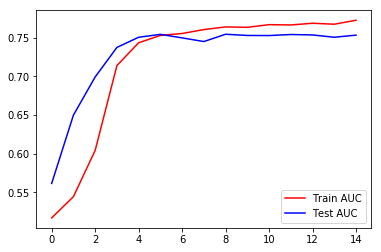

In [0]:
plt.plot(history_1.history['auroc'], 'r')
plt.plot(history_1.history['val_auroc'], 'b')
plt.legend({'Train AUC': 'r', 'Test AUC':'b'})
plt.show()

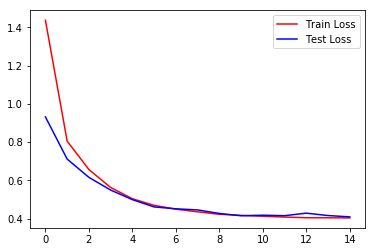

In [0]:
plt.plot(history_1.history['loss'], 'r')
plt.plot(history_1.history['val_loss'], 'b')
plt.legend({'Train Loss': 'r', 'Test Loss':'b'})
plt.show()

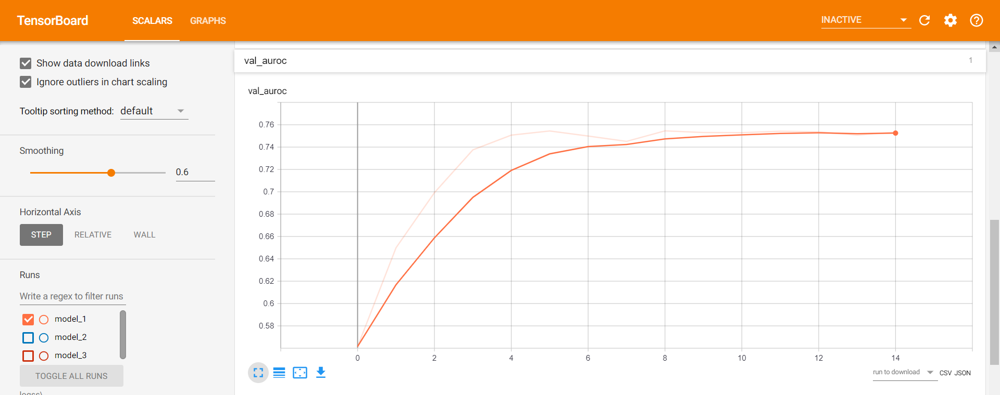

In [1]:
from IPython.display import Image
Image("model1auc.png")

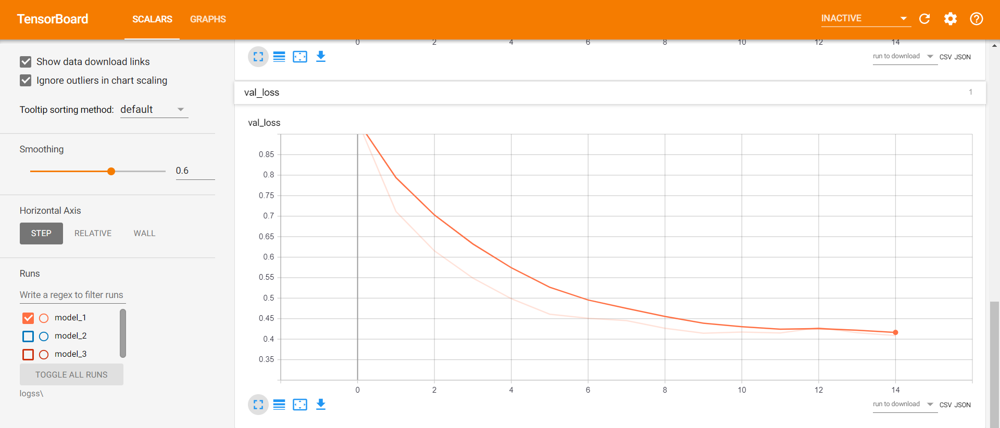

In [2]:
from IPython.display import Image
Image("model1loss.png")

### I'm able to get 0.75+ for Model-1 itself, lets see if we can improve for other models

### Model-2

Use the same model as above but for 'input_seq_total_text_data' give only some words in the sentance not all the words. Filter the words as below. 

<pre>
1. Train the TF-IDF on the Train data feature 'essay' <br>
2. Get the idf value for each word we have in the train data. <br>
3. Remove the low idf value and high idf value words from our data. Do some analysis on the Idf values and based on those values choose the low and high threshold value. Because very frequent words and very very rare words don't give much information. (you can plot a box plots and take only the idf scores within IQR range and corresponding words)<br>
4. Train the LSTM after removing the Low and High idf value words. (In model-1 Train on total data but in Model-2 train on data after removing some words based on IDF values)
</pre>

In [0]:
# importing required libraries
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
from keras.layers import Input, Embedding, LSTM, Dropout, BatchNormalization, Dense, concatenate, Flatten, Conv1D, MaxPool1D, LeakyReLU, ELU, SpatialDropout1D, MaxPooling1D, GlobalAveragePooling1D, GlobalMaxPooling1D
from keras.preprocessing.text import Tokenizer, one_hot
from keras.preprocessing.sequence import pad_sequences
from keras.models import Model, load_model
from keras import regularizers
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard, ReduceLROnPlateau
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics import roc_auc_score
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
import re
from tqdm import tqdm
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import pickle

Using TensorFlow backend.


In [0]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm_notebook as tqdm1
from tqdm import tqdm
import time
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

from sklearn.model_selection import train_test_split

In [0]:
# project_data = pd.read_csv('preprocessed_data.csv')
# project_data.head()

In [0]:
# project_data = pd.read_csv('train_data.csv', nrows=50000)
project_data = pd.read_csv('train_data.csv', nrows=60000)
resource_data = pd.read_csv('resources.csv')

In [0]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (60000, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


## Text preprocessing(1)

In [0]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())

In [0]:
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)
project_data.head(5)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,"Civics & Government, Team Sports",Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms.,AZ,2016-08-31 12:03:56,Grades 6-8,"Health & Wellness, Team Sports",Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,NaN,NaN,"My students need shine guards, athletic socks,...",1,0,Health_Sports
3,45,p246581,f3cb9bffbba169bef1a77b243e620b60,Mrs.,KY,2016-10-06 21:16:17,Grades PreK-2,"Literacy, Mathematics",Techie Kindergarteners,I work at a unique school filled with both ESL...,My students live in high poverty conditions wi...,NaN,NaN,My students need to engage in Reading and Math...,4,1,Literacy_Language Math_Science
4,172407,p104768,be1f7507a41f8479dc06f047086a39ec,Mrs.,TX,2016-07-11 01:10:09,Grades PreK-2,Mathematics,Interactive Math Tools,Our second grade classroom next year will be m...,"For many students, math is a subject that does...",NaN,NaN,My students need hands on practice in mathemat...,1,1,Math_Science


In [0]:

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())
my_counter

Counter({'Literacy_Language': 28785,
         'History_Civics': 3229,
         'Health_Sports': 7854,
         'Math_Science': 22654,
         'SpecialNeeds': 7431,
         'AppliedLearning': 6662,
         'Music_Arts': 5658,
         'Warmth': 781,
         'Care_Hunger': 781})

In [0]:
# dict sort by value python: https://stackoverflow.com/a/613218/4084039
cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


# ind = np.arange(len(sorted_cat_dict))
# plt.figure(figsize=(20,5))
# p1 = plt.bar(ind, list(sorted_cat_dict.values()))

# plt.ylabel('Projects')
# plt.title('% of projects aproved category wise')
# plt.xticks(ind, list(sorted_cat_dict.keys()))
# plt.show()
# print(sorted_cat_dict)

In [0]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

In [0]:
project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports


In [0]:
# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
from collections import Counter
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())

In [0]:
# dict sort by value python: https://stackoverflow.com/a/613218/4084039
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))


# ind = np.arange(len(sorted_sub_cat_dict))
# plt.figure(figsize=(20,5))
# p1 = plt.bar(ind, list(sorted_sub_cat_dict.values()))

# plt.ylabel('Projects')
# plt.title('% of projects aproved state wise')
# plt.xticks(ind, list(sorted_sub_cat_dict.keys()))
# plt.show()

In [0]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [0]:
# https://stackoverflow.com/questions/22407798/how-to-reset-a-dataframes-indexes-for-all-groups-in-one-step
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
price_data.head(2)

,id,price,quantity
0,p000001,459.56,7
1,p000002,515.89,21


In [0]:
# join two dataframes in python: 
project_data = pd.merge(project_data, price_data, on='id', how='left')

In [0]:
#presence of the numerical digits in a strings with numeric : https://stackoverflow.com/a/19859308/8089731
def hasNumbers(inputString):
    return any(i.isdigit() for i in inputString)
p1 = project_data[['id','project_resource_summary']]
p1 = pd.DataFrame(data=p1)
p1.columns = ['id','digits_in_summary']
p1['digits_in_summary'] =  p1['digits_in_summary'].map(hasNumbers)
# https://stackoverflow.com/a/17383325/8089731
p1['digits_in_summary'] = p1['digits_in_summary'].astype(int)
project_data = pd.merge(project_data, p1, on='id', how='left')
project_data.head(5)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,...,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",...,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...,154.60,23,0
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,...,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...,299.00,1,0
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms.,AZ,2016-08-31 12:03:56,Grades 6-8,Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,...,NaN,"My students need shine guards, athletic socks,...",1,0,Health_Sports,Health_Wellness TeamSports,"\r\n\""True champions aren't always the ones th...",516.85,22,0
3,45,p246581,f3cb9bffbba169bef1a77b243e620b60,Mrs.,KY,2016-10-06 21:16:17,Grades PreK-2,Techie Kindergarteners,I work at a unique school filled with both ESL...,My students live in high poverty conditions wi...,...,NaN,My students need to engage in Reading and Math...,4,1,Literacy_Language Math_Science,Literacy Mathematics,I work at a unique school filled with both ESL...,232.90,4,0
4,172407,p104768,be1f7507a41f8479dc06f047086a39ec,Mrs.,TX,2016-07-11 01:10:09,Grades PreK-2,Interactive Math Tools,Our second grade classroom next year will be m...,"For many students, math is a subject that does...",...,NaN,My students need hands on practice in mathemat...,1,1,Math_Science,Mathematics,Our second grade classroom next year will be m...,67.98,4,0


## Text preprocessing(2)

In [0]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [0]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [0]:
# Combining all the above statemennts 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm1(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    sent = re.sub('nannan', '', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

In [0]:
from tqdm import tqdm
preprocessed_titles = []
# tqdm is for printing the status bar
for title in tqdm1(project_data['project_title'].values):
    _title = decontracted(title)
    _title = _title.replace('\\r', ' ')
    _title = _title.replace('\\"', ' ')
    _title = _title.replace('\\n', ' ')
    _title = re.sub('[^A-Za-z0-9]+', ' ', _title)
    # https://gist.github.com/sebleier/554280
    _title = ' '.join(e for e in _title.split() if e not in stopwords)
    preprocessed_titles.append(_title.lower().strip())

In [0]:
preprocessed_titles[1000]

'sailing into super 4th grade year'

In [0]:
project_grade_catogories = list(project_data['project_grade_category'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

project_grade_cat_list = []
for i in tqdm1(project_grade_catogories):
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    project_grade_cat_list.append(temp.strip())

In [0]:
project_data['clean_project_grade_category'] = project_grade_cat_list
project_data.drop(['project_grade_category'], axis=1, inplace=True)
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_essay_1,project_essay_2,project_essay_3,...,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary,clean_project_grade_category
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,...,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...,154.6,23,0,GradesPreK-2
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,...,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...,299.0,1,0,Grades6-8


In [0]:
project_data.drop(['project_essay_1','project_essay_2','project_essay_3','project_essay_4'], axis=1, inplace=True)
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary,clean_project_grade_category
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Educational Support for English Learners at Home,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...,154.6,23,0,GradesPreK-2
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Wanted: Projector for Hungry Learners,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...,299.0,1,0,Grades6-8


In [0]:
#Replacing Nan's with maximum occured value: https://stackoverflow.com/a/51053916/8089731
project_data['teacher_prefix'].value_counts().argmax()
project_data.fillna(value=project_data['teacher_prefix'].value_counts().argmax(),axis=1,inplace=True)

In [0]:
project_data['preprocessed_essays'] = preprocessed_essays
project_data['preprocessed_titles'] = preprocessed_titles

In [0]:
X_train, X_test, y_train, y_test = train_test_split(project_data,project_data['project_is_approved'], test_size=0.33, stratify = project_data['project_is_approved'])
# X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train)

X_train.drop(['project_is_approved'], axis=1, inplace=True)
X_test.drop(['project_is_approved'], axis=1, inplace=True)
# X_cv.drop(['project_is_approved'], axis=1, inplace=True)
print(X_train.shape)
print(X_test.shape)

(40200, 18)
(19800, 18)


In [0]:
X_train

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_resource_summary,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary,clean_project_grade_category,preprocessed_essays,preprocessed_titles
53990,73517,p081693,ba962cbafe31df98f6a222190ec180e1,Mr.,LA,2016-10-07 10:58:43,Write On!,My students need pencils for classroom work an...,8,Math_Science Literacy_Language,AppliedSciences Literature_Writing,My students are my inspiration. They come to s...,2.69,42,0,Grades6-8,my students inspiration they come school full ...,write on
26175,68310,p169729,9c42729a83ab872a10224912a57074f1,Ms.,NJ,2016-07-28 18:26:15,A Splash of Color,"My students need a comfortable, colorful readi...",3,Literacy_Language,Literacy,Our school is centered in the heart of the cit...,181.03,11,0,Grades6-8,our school centered heart city either rampant ...,a splash color
28017,116471,p206399,eae27d7cfb841470d31a0caea6b3b288,Mrs.,OR,2017-01-10 18:24:13,Resource Room Students Seek Resources! (Headse...,My students need headphones with a microphone ...,0,Literacy_Language SpecialNeeds,Literature_Writing SpecialNeeds,My students are K-5th graders who spend the ma...,29.95,20,0,Grades3-5,my students k 5th graders spend majority day r...,resource room students seek resources headsets...
45842,13608,p123373,50514d830baa865acd4cc57e23b344a5,Mrs.,GA,2016-08-18 21:29:51,Magic Carpet,My students need a large rectangular carpet wh...,5,Literacy_Language,Literacy Literature_Writing,My second grade students are still excited abo...,479.00,1,0,GradesPreK-2,my second grade students still excited learnin...,magic carpet
6603,8248,p178167,f29ea1c7c7fbabe9dfc504cc55f7b26a,Mrs.,FL,2017-01-06 22:17:22,Books! Books! Books! We Want More Books!,My students need to get their hands on BOOKS!!...,2,Literacy_Language,Literacy,My class is a FAMILY...a growing family! Eac...,399.30,29,0,GradesPreK-2,my class family growing family each every stud...,books books books we want more books
57387,80232,p021799,2b376452e1ef640d5ecde27641a3a7b4,Mrs.,KY,2016-06-16 01:18:01,Tables for Collaboration,My students need tables in order to collaborat...,2,AppliedLearning,EarlyDevelopment,Our school serves students in grades P-5 and p...,212.67,5,0,GradesPreK-2,our school serves students grades p 5 provides...,tables collaboration
16576,132341,p014368,493838a03fc6cda0229db2c9fb60597c,Mrs.,OK,2016-12-01 11:34:38,"Getting a \""Feel\"" on Learning! (Sensory Table)",My students need a sand and water table. This ...,0,AppliedLearning Math_Science,EarlyDevelopment Mathematics,I have 24 very energetic and smart Kindergartn...,319.00,1,0,GradesPreK-2,i 24 energetic smart kindergartners they love ...,getting feel learning sensory table
17698,104159,p248216,9db49183c0fdfba52fe5fb4d26824411,Mrs.,WI,2017-01-16 14:21:17,Gotta Keep Reading!,My students need high interest books to help t...,12,Literacy_Language,Literacy,I teach in a 4th grade classroom in an urban s...,171.73,24,0,Grades3-5,i teach 4th grade classroom urban school distr...,gotta keep reading
55821,166737,p199098,3aa717ec73f2e5b9b0bcb2c92c6dc62a,Ms.,GA,2016-06-03 19:12:00,Spectacular Scientists,My students need the Learning Science Activity...,1,Math_Science,EnvironmentalScience Health_LifeScience,My classroom is comprised of 2 groups of aroun...,499.00,1,0,Grades3-5,my classroom comprised 2 groups around 20 stud...,spectacular scientists
42662,14486,p000320,c4a43211a120ec6bdf97555e2b4d6b17,Mrs.,MO,2016-06-28 18:04:39,Organized 4 Success!,My students need tools to help them stay organ...,0,Literacy_Language Math_Science,Literacy Mathematics,"My fifth grade students learn in a bright, wel...",63.99,146,0,Grades3-5,my fifth grade students learn bright welcoming...,organized 4 success


In [0]:
import dill 
# dill.dump_session('notebook_envall.db') 
dill.load_session('notebook_envall.db')

Using TensorFlow backend.


In [0]:
from numpy import array
from numpy import asarray
from numpy import zeros
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Embedding 

In [0]:
tfidf = TfidfVectorizer()
_tfidf = tfidf.fit_transform(X_train["essay"])
_dict = dict(zip(tfidf.get_feature_names(),list(tfidf.idf_)))
tfidf_df = pd.DataFrame(list(_dict.items()), columns=['Words', 'Values'])
tfidf_df = tfidf_df.sort_values(by ='Values' )

Text(0.5, 1.0, 'VIOLIN plot of idf')

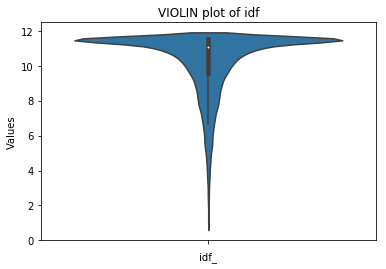

In [0]:
sns.violinplot(x = "Values",data=tfidf_df,orient="v")
plt.xlabel("idf_")
plt.title("VIOLIN plot of idf")

Text(0.5, 1.0, 'BOXEN plot of idf')

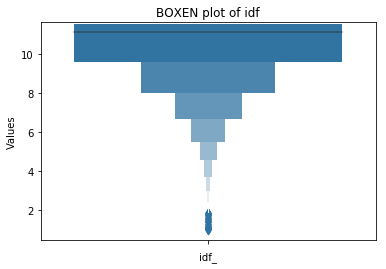

In [0]:
sns.boxenplot(x = "Values",data=tfidf_df,orient="v")
plt.xlabel("idf_")
plt.title("BOXEN plot of idf")

Text(0.5, 1.0, 'BOX plot of idf')

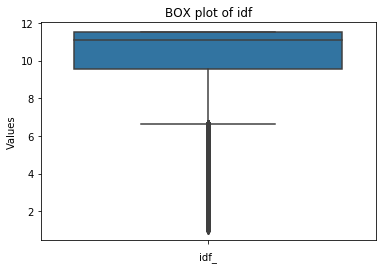

In [0]:
sns.boxplot(x = "Values",data=tfidf_df,orient="v")
plt.xlabel("idf_")
plt.title("BOX plot of idf")

In [0]:
print("0 - 100 Quantiles:")
print(np.percentile(tfidf_df['Values'],np.arange(0, 100, 25)))

0 - 100 Quantiles:
[ 1.0001093   9.56185239 11.10229743 11.50776253]


In [0]:
print("1th Percentile")
print(np.percentile(tfidf_df['Values'],1))
print("\n27th Percentiles")
print(np.percentile(tfidf_df['Values'],27))

1th Percentile
3.983908779165195

27th Percentiles
9.716003065714995


In [0]:
tfidf_fil = tfidf_df[(tfidf_df["Values"] >=  np.percentile(tfidf_df['Values'],1)) & (tfidf_df["Values"] <=  np.percentile(tfidf_df['Values'],25))]

Text(0.5, 1.0, 'VIOLIN plot of idf')

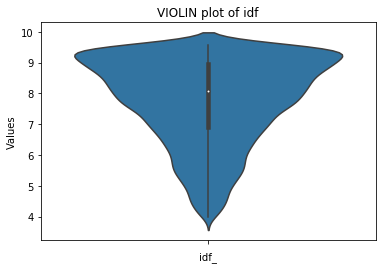

In [0]:
sns.violinplot(x = "Values",data=tfidf_fil,orient="v")
plt.xlabel("idf_")
plt.title("VIOLIN plot of idf")

In [0]:
fil_words = tfidf_fil["Words"].tolist()

In [0]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(fil_words)
seq_train = tokenizer.texts_to_sequences(X_train["essay"])
seq_test = tokenizer.texts_to_sequences(X_test["essay"])

In [0]:
vocab_size = len(tokenizer.word_index) + 1

In [0]:
padded_train = pad_sequences(seq_train,maxlen=800,padding='post', truncating='post')
padded_test = pad_sequences(seq_test, maxlen=800,padding='post', truncating='post')

In [0]:
pickle_in = open("/content/drive/My Drive/AAIC/Assignments/glove_vectors","rb")
glove_words = pickle.load(pickle_in)

In [0]:
embedding_matrix = zeros((vocab_size, 300))
for word, i in tokenizer.word_index.items():
    embedding_vector = glove_words.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

In [0]:
# input_text = Input(shape=(800,),name="input_text")
embedding_layer = Embedding(vocab_size,300,weights=[embedding_matrix],input_length=800,trainable=False)
input_text = Input(shape=(800,),name="input_text")
x = embedding_layer(input_text)
x = LSTM(128,recurrent_dropout=0.5,kernel_regularizer=regularizers.l2(0.001),return_sequences=True)(x)
flat_1 = Flatten()(x)






Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [0]:
# Teacher Prefix
no_of_unique_prefix  = X_train["teacher_prefix"].nunique()
embed_size_prefix = int(min(np.ceil((no_of_unique_prefix)/2), 50 ))

input_prefix = Input(shape=(1,),name="teacher_prefix")
embed_prefix = Embedding(no_of_unique_prefix,embed_size_prefix,trainable=True)(input_prefix)
flat_2 = Flatten()(embed_prefix)
lab_enc = LabelEncoder()
enc_prefix_train = lab_enc.fit_transform(X_train["teacher_prefix"])
X_test["teacher_prefix"] = X_test["teacher_prefix"].map(lambda s: ' ' if s not in lab_enc.classes_ else s)
lab_enc.classes_ = np.append(lab_enc.classes_, ' ')
enc_prefix_test = lab_enc.transform(X_test["teacher_prefix"])

In [0]:
# School State
no_of_unique_state  = X_train["school_state"].nunique()
embed_size_state= int(min(np.ceil((no_of_unique_state)/2), 50 ))

input_state = Input(shape=(1,),name="school_prefix")
embed_state = Embedding(no_of_unique_state,embed_size_state,name="emb_state",trainable=True)(input_state)
flat_3 = Flatten()(embed_state)
enc_state_train = lab_enc.fit_transform(X_train["school_state"])
enc_state_test = lab_enc.transform(X_test["school_state"])

In [0]:
X_train

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_resource_summary,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary,clean_project_grade_category,preprocessed_essays,preprocessed_titles
61692,9233,p134729,2fba990f30bae627a30c12abc14b4ef8,Mrs.,LA,2016-09-24 15:42:06,Going for the Chrome... 2016!!,My students need 2 Chromebooks to help meet th...,2,AppliedLearning Math_Science,College_CareerPrep Mathematics,Gone are the days of printing worksheet after ...,249.00,2,1,Grades3-5,gone days printing worksheet worksheet in era ...,going chrome 2016
101374,30334,p190416,b62d6e4ad22c5fcc2063d3eb99713627,Ms.,NY,2017-02-26 19:38:33,"Bringing the Script to Life; Props, Costumes, ...",My students need costume pieces and props to b...,6,Music_Arts,PerformingArts,My students are the actors of Riverhead Charte...,351.70,58,0,Grades6-8,my students actors riverhead charter school al...,bringing script life props costumes set design
8708,89772,p149606,b642d19bb72bc81afe90784121562e92,Ms.,NM,2016-08-26 20:01:06,Chrometastic Oppertunity!,My students need Chromebooks in order to acces...,29,SpecialNeeds,SpecialNeeds,"My students consist of 12 kindergarten, first,...",167.99,3,1,GradesPreK-2,my students consist 12 kindergarten first seco...,chrometastic oppertunity
70173,6607,p009634,c751cdc864bdc94a7c73fbc8d81f6260,Ms.,LA,2016-08-25 20:11:56,Flood DSJH with Love,My students need CALCULATORS to help them navi...,2,Math_Science,Mathematics,"My students are hardworking, selfless \""little...",115.99,3,0,Grades6-8,my students hardworking selfless little people...,flood dsjh love
90839,144635,p000962,413dd95145e3bc9940e70f7dcf1c6304,Mr.,AZ,2016-05-23 13:14:02,Supplies for the Perfect Sound,My students need instrument basic such as: ree...,0,Music_Arts,Music,Everyday is music to my hears when my students...,251.77,46,0,Grades6-8,everyday music hears students get chance play ...,supplies perfect sound
62631,78012,p212397,53ccd40b8bd6f268ab7a0c73be3c0128,Mrs.,TX,2016-09-14 13:10:23,The More You Read the More You Know!,My students need books and supplies for an eff...,0,Literacy_Language,Literacy,"My intervention classroom is full of fun, hand...",419.74,17,0,Grades3-5,my intervention classroom full fun hands chall...,the more you read more you know
41361,50382,p237295,50e93b8c452382361a4847f4bb3acf24,Mrs.,MI,2016-09-23 14:25:05,Books for Low Income Toddlers with Special Needs,My students need books to read at home with th...,4,SpecialNeeds,SpecialNeeds,Early Childhood Special Education teachers spe...,150.90,36,0,GradesPreK-2,early childhood special education teachers spe...,books low income toddlers special needs
97600,28582,p136590,c0432ba8cc235436596dd1e9184ca59d,Mr.,CO,2016-09-20 15:03:21,Everyday art supplies.,"My students need watercolor paper, markers, pa...",0,Music_Arts,VisualArts,My students absolutely love art. Each day they...,226.95,28,0,Grades3-5,my students absolutely love art each day walk ...,everyday art supplies
67695,85668,p204009,c9fd190fc4673e37fdfd919816f8fb34,Ms.,CA,2016-12-29 00:57:50,Robots Are Taking Over Our Classroom!,My students need Wonder Workshop robots so the...,10,Math_Science,AppliedSciences Mathematics,"My students are eager, hardworking 1st graders...",279.99,1,0,GradesPreK-2,my students eager hardworking 1st graders fill...,robots are taking over our classroom
62517,177330,p039526,aa96ef933643e81d26495f0cbaea40aa,Ms.,MI,2016-09-04 22:40:27,We Are Going to Have a Ball!,"My students need basketballs, soccer balls, an...",3,Health_Sports,Gym_Fitness TeamSports,"In my 3rd grade class, I have 12 children who ...",160.46,11,0,Grades3-5,in 3rd grade class i 12 children speak differe...,we are going have ball


In [0]:
#project_grade_category
no_of_unique_grade  = X_train["clean_project_grade_category"].nunique()
embed_size_grade = int(min(np.ceil((no_of_unique_grade)/2), 50 ))

input_grade= Input(shape=(1,),name="grade_cat")
embed_grade = Embedding(no_of_unique_grade,embed_size_grade,name="emb_grade",trainable=True)(input_grade)
flat_4 = Flatten()(embed_grade)
lab_enc = LabelEncoder()
enc_grade_train = lab_enc.fit_transform(X_train["clean_project_grade_category"])
enc_grade_test = lab_enc.transform(X_test["clean_project_grade_category"])

In [0]:
#project_subject_categories
no_of_unique_subcat  = X_train["clean_categories"].nunique()
embed_size_subcat = int(min(np.ceil((no_of_unique_subcat)/2), 50 ))

input_subcat= Input(shape=(1,),name="sub_cat")
embed_subcat = Embedding(no_of_unique_subcat,embed_size_subcat,name="emb_subcat",trainable=True)(input_subcat)
flat_5 = Flatten()(embed_subcat)
lab_enc = LabelEncoder()
enc_subcat_train = lab_enc.fit_transform(X_train["clean_categories"])
X_test["clean_categories"] = X_test["clean_categories"].map(lambda s: ' ' if s not in lab_enc.classes_ else s)
lab_enc.classes_ = np.append(lab_enc.classes_, ' ')
enc_subcat_test= lab_enc.transform(X_test["clean_categories"])

In [0]:
#project_subject_subcategories
no_of_unique_subcat_1  = X_train["clean_subcategories"].nunique()
embed_size_subcat_1 = int(min(np.ceil((no_of_unique_subcat_1)/2), 50 ))

input_subcat_1= Input(shape=(1,),name="sub_cat_1")
embedding_subcat_1 = Embedding(no_of_unique_subcat_1,embed_size_subcat_1,name="emb_subcat_1",trainable=True)(input_subcat_1)
flat_6 = Flatten()(embedding_subcat_1)
lab_enc = LabelEncoder()
enc_subcat_1_train = lab_enc.fit_transform(X_train["clean_subcategories"])
X_test["clean_subcategories"] = X_test["clean_subcategories"].map(lambda s: ' ' if s not in lab_enc.classes_ else s)
lab_enc.classes_ = np.append(lab_enc.classes_, ' ')
enc_subcat_1_test= lab_enc.transform(X_test["clean_subcategories"])

In [0]:
numerical_train_a=X_train['digits_in_summary'].values.reshape(-1, 1)
numerical_train_b=X_train['price'].values.reshape(-1, 1)
numerical_train_c=X_train['quantity'].values.reshape(-1, 1)
numerical_train_d=X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1)
numerical_test_a=X_test['digits_in_summary'].values.reshape(-1, 1)
numerical_test_b=X_test['price'].values.reshape(-1, 1)
numerical_test_c=X_test['quantity'].values.reshape(-1, 1)
numerical_test_d=X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1)
numerical_train=np.concatenate((numerical_train_a,numerical_train_b,numerical_train_c,numerical_train_d),axis=1)
numerical_test=np.concatenate((numerical_test_a,numerical_test_b,numerical_test_c,numerical_test_d),axis=1)

from sklearn.preprocessing import StandardScaler
normal=StandardScaler()
normal_train=normal.fit_transform(numerical_train)
normal_test=normal.transform(numerical_test)

In [0]:
numerical_feats = Input(shape=(4,),name="numerical_features")
numerical_featss = Dense(100,activation="relu",kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(numerical_feats)

In [0]:
x = concatenate([flat_1,flat_2,flat_3,flat_4,flat_5,flat_6,numerical_featss])
x = Dense(128,activation="relu", kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(x)
x=Dropout(0.5)(x)
x = Dense(256,activation="relu",kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(x)
x=Dropout(0.5)(x)
x = Dense(64,activation="relu", kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(x)
x = BatchNormalization()(x)
output = Dense(2, activation='softmax', name='output')(x)
model_1 = Model(inputs=[input_text,input_prefix,input_state,input_grade,input_subcat,input_subcat_1,numerical_feats],outputs=[output])

In [0]:
train_data_1 = [padded_train,enc_prefix_train,enc_state_train,enc_grade_train,enc_subcat_train,enc_subcat_1_train,normal_train]
test_data_1 = [padded_test,enc_prefix_test,enc_state_test,enc_grade_test,enc_subcat_test,enc_subcat_1_test,normal_test]

In [0]:
from keras.utils import np_utils
Y_train = np_utils.to_categorical(y_train, 2) 
Y_test = np_utils.to_categorical(y_test, 2)

In [0]:
import tensorflow as tf
from sklearn.metrics import roc_auc_score

def auroc(y_true, y_pred):
    return tf.py_func(roc_auc_score, (y_true, y_pred), tf.double)

In [0]:
model_1.compile(optimizer=Adam(lr=0.001), loss='categorical_crossentropy', metrics=[auroc])


Instructions for updating:
tf.py_func is deprecated in TF V2. Instead, there are two
    options available in V2.
    - tf.py_function takes a python function which manipulates tf eager
    tensors instead of numpy arrays. It's easy to convert a tf eager tensor to
    an ndarray (just call tensor.numpy()) but having access to eager tensors
    means `tf.py_function`s can use accelerators such as GPUs as well as
    being differentiable using a gradient tape.
    - tf.numpy_function maintains the semantics of the deprecated tf.py_func
    (it is not differentiable, and manipulates numpy arrays). It drops the
    stateful argument making all functions stateful.
    


In [0]:
checkpoint_3 = ModelCheckpoint("model_2.h5",monitor="val_auroc",mode="max",save_best_only = True,verbose=1)
NAME = 'model_2'
tensorboard_2 = TensorBoard(log_dir='logss\{}'.format(NAME),update_freq='epoch',batch_size=512)
callbacks_2 = [tensorboard_2,checkpoint_3]

In [0]:
# from tensorflow.keras.callbacks import TensorBoard
# import time

# # NAME = 'cc-{}'.format(int(time.time()))
# # tensorboardd = TensorBoard(log_dir='C:\Users\LENOVO\Desktop\applidai\AAIC\logss\\')
# NAME = 'model_2'
# tensorboardd = TensorBoard(log_dir='logss\{}'.format(NAME),update_freq='epoch',batch_size=320)
# # tensorboard_1 = TensorBoard(log_dir='logss\{}'.format(NAME), histogram_freq=0, batch_size=320, write_graph=True, write_grads=False, write_images=False, embeddings_freq=0, embeddings_layer_names=None, embeddings_metadata=None, embeddings_data=None, update_freq='epoch')

In [0]:
history_1 = model_1.fit(train_data_1,Y_train,batch_size=512,epochs=15,validation_data=(test_data_1,Y_test),verbose=1,callbacks=callbacks_2)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Train on 73196 samples, validate on 36052 samples


Epoch 1/15
73196/73196 [==============================] - 207s 3ms/step - loss: 1.3543 - auroc: 0.5970 - val_loss: 0.9149 - val_auroc: 0.6827

Epoch 00001: val_auroc improved from -inf to 0.68273, saving model to model_2.h5
Epoch 2/15
73196/73196 [==============================] - 204s 3ms/step - loss: 0.7764 - auroc: 0.6945 - val_loss: 0.6924 - val_auroc: 0.7092

Epoch 00002: val_auroc improved from 0.68273 to 0.70924, saving model to model_2.h5
Epoch 3/15
73196/73196 [==============================] - 203s 3ms/step - loss: 0.6215 - auroc: 0.7146 - val_loss: 0.5818 - val_auroc: 0.7125

Epoch 00003: val_auroc improved from 0.70924 to 0.71249, saving model to model_2.h5
Epoch 4/15
73196/73196 [==============================] - 203s 3ms/step - loss: 0.5423 - auroc: 0.7184 - val_loss: 0.5282 - val_auroc: 0.7132

Epoch 00004: val_auroc improved f

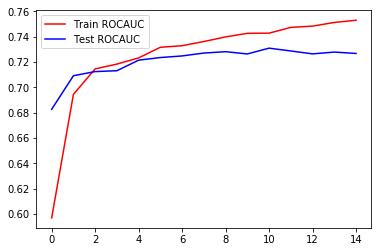

In [0]:
plt.plot(history_1.history['auroc'], 'r')
plt.plot(history_1.history['val_auroc'], 'b')
plt.legend({'Train ROCAUC': 'r', 'Test ROCAUC':'b'})
plt.show()


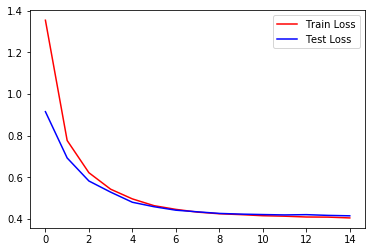

In [0]:
plt.plot(history_1.history['loss'], 'r')
plt.plot(history_1.history['val_loss'], 'b')
plt.legend({'Train Loss': 'r', 'Test Loss':'b'})
plt.show()

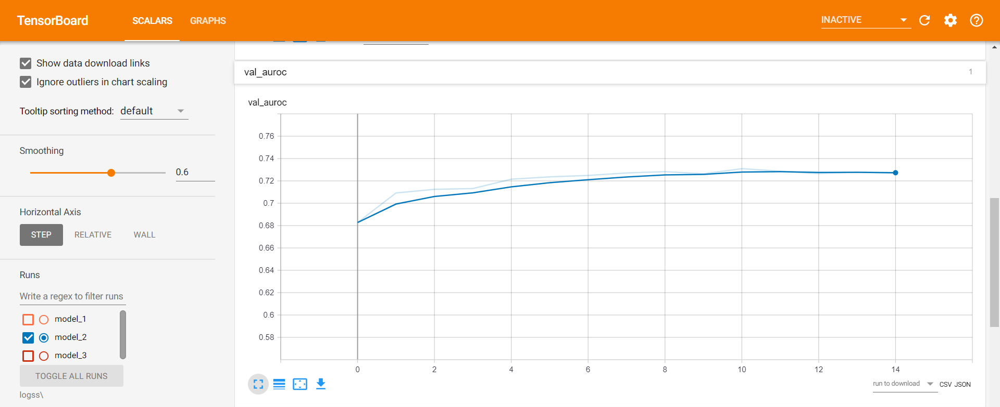

In [3]:
from IPython.display import Image
Image("model2auc.png")

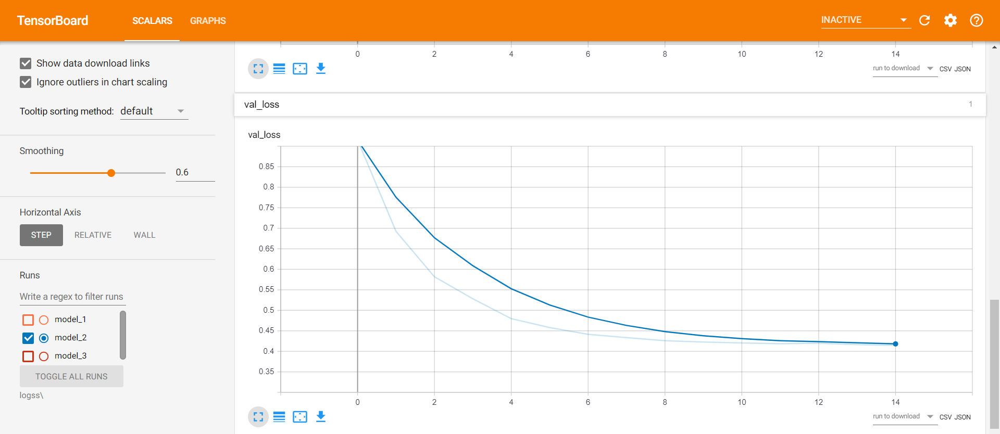

In [4]:
from IPython.display import Image
Image("model2loss.png")

### Model-2(0.72) is not performing well when compared to Model-1 

### Model-3

<img src='https://i.imgur.com/fkQ8nGo.png'>
ref: https://i.imgur.com/fkQ8nGo.png


- __input_seq_total_text_data__: <br>
<pre>
    . Use text column('essay'), and use the Embedding layer to get word vectors. <br>
    . Use given predefined glove word vectors, don't train any word vectors. <br>
    . Use LSTM that is given above, get the LSTM output and Flatten that output. <br>
    . You are free to preprocess the input text as you needed. <br>
</pre>
- __Other_than_text_data__:<br>
<pre>
    . Convert all your Categorical values to onehot coded and then concatenate all these onehot vectors <br>
    . Neumerical values and use <a href='https://keras.io/getting-started/sequential-model-guide/#sequence-classification-with-1d-convolutions'>CNN1D</a> as shown in above figure. <br>
    . You are free to choose all CNN parameters like kernel sizes, stride.<br>
    
</pre>

In [0]:
# importing required libraries
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
from keras.layers import Input, Embedding, LSTM, Dropout, BatchNormalization, Dense, concatenate, Flatten, Conv1D, MaxPool1D, LeakyReLU, ELU, SpatialDropout1D, MaxPooling1D, GlobalAveragePooling1D, GlobalMaxPooling1D
from keras.preprocessing.text import Tokenizer, one_hot
from keras.preprocessing.sequence import pad_sequences
from keras.models import Model, load_model
from keras import regularizers
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard, ReduceLROnPlateau
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics import roc_auc_score
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
import re
from tqdm import tqdm
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import pickle

Using TensorFlow backend.


In [0]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm_notebook as tqdm1
from tqdm import tqdm
import time
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

from sklearn.model_selection import train_test_split

In [0]:
# project_data = pd.read_csv('preprocessed_data.csv')
# project_data.head()

In [0]:
# project_data = pd.read_csv('train_data.csv', nrows=50000)
project_data = pd.read_csv('train_data.csv',nrows=60000)
resource_data = pd.read_csv('resources.csv')

In [0]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (109248, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


## Text preprocessing(1)

In [0]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())

In [0]:
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)
project_data.head(5)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,"Civics & Government, Team Sports",Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms.,AZ,2016-08-31 12:03:56,Grades 6-8,"Health & Wellness, Team Sports",Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,NaN,NaN,"My students need shine guards, athletic socks,...",1,0,Health_Sports
3,45,p246581,f3cb9bffbba169bef1a77b243e620b60,Mrs.,KY,2016-10-06 21:16:17,Grades PreK-2,"Literacy, Mathematics",Techie Kindergarteners,I work at a unique school filled with both ESL...,My students live in high poverty conditions wi...,NaN,NaN,My students need to engage in Reading and Math...,4,1,Literacy_Language Math_Science
4,172407,p104768,be1f7507a41f8479dc06f047086a39ec,Mrs.,TX,2016-07-11 01:10:09,Grades PreK-2,Mathematics,Interactive Math Tools,Our second grade classroom next year will be m...,"For many students, math is a subject that does...",NaN,NaN,My students need hands on practice in mathemat...,1,1,Math_Science


In [0]:

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())
my_counter

Counter({'Literacy_Language': 52239,
         'History_Civics': 5914,
         'Health_Sports': 14223,
         'Math_Science': 41421,
         'SpecialNeeds': 13642,
         'AppliedLearning': 12135,
         'Music_Arts': 10293,
         'Warmth': 1388,
         'Care_Hunger': 1388})

In [0]:
# dict sort by value python: https://stackoverflow.com/a/613218/4084039
cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


# ind = np.arange(len(sorted_cat_dict))
# plt.figure(figsize=(20,5))
# p1 = plt.bar(ind, list(sorted_cat_dict.values()))

# plt.ylabel('Projects')
# plt.title('% of projects aproved category wise')
# plt.xticks(ind, list(sorted_cat_dict.keys()))
# plt.show()
# print(sorted_cat_dict)

In [0]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

In [0]:
project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports


In [0]:
# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
from collections import Counter
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())

In [0]:
# dict sort by value python: https://stackoverflow.com/a/613218/4084039
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))


# ind = np.arange(len(sorted_sub_cat_dict))
# plt.figure(figsize=(20,5))
# p1 = plt.bar(ind, list(sorted_sub_cat_dict.values()))

# plt.ylabel('Projects')
# plt.title('% of projects aproved state wise')
# plt.xticks(ind, list(sorted_sub_cat_dict.keys()))
# plt.show()

In [0]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [0]:
# https://stackoverflow.com/questions/22407798/how-to-reset-a-dataframes-indexes-for-all-groups-in-one-step
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
price_data.head(2)

,id,price,quantity
0,p000001,459.56,7
1,p000002,515.89,21


In [0]:
# join two dataframes in python: 
project_data = pd.merge(project_data, price_data, on='id', how='left')

In [0]:
#presence of the numerical digits in a strings with numeric : https://stackoverflow.com/a/19859308/8089731
def hasNumbers(inputString):
    return any(i.isdigit() for i in inputString)
p1 = project_data[['id','project_resource_summary']]
p1 = pd.DataFrame(data=p1)
p1.columns = ['id','digits_in_summary']
p1['digits_in_summary'] =  p1['digits_in_summary'].map(hasNumbers)
# https://stackoverflow.com/a/17383325/8089731
p1['digits_in_summary'] = p1['digits_in_summary'].astype(int)
project_data = pd.merge(project_data, p1, on='id', how='left')
project_data.head(5)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,...,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",...,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...,154.60,23,0
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,...,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...,299.00,1,0
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms.,AZ,2016-08-31 12:03:56,Grades 6-8,Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,...,NaN,"My students need shine guards, athletic socks,...",1,0,Health_Sports,Health_Wellness TeamSports,"\r\n\""True champions aren't always the ones th...",516.85,22,0
3,45,p246581,f3cb9bffbba169bef1a77b243e620b60,Mrs.,KY,2016-10-06 21:16:17,Grades PreK-2,Techie Kindergarteners,I work at a unique school filled with both ESL...,My students live in high poverty conditions wi...,...,NaN,My students need to engage in Reading and Math...,4,1,Literacy_Language Math_Science,Literacy Mathematics,I work at a unique school filled with both ESL...,232.90,4,0
4,172407,p104768,be1f7507a41f8479dc06f047086a39ec,Mrs.,TX,2016-07-11 01:10:09,Grades PreK-2,Interactive Math Tools,Our second grade classroom next year will be m...,"For many students, math is a subject that does...",...,NaN,My students need hands on practice in mathemat...,1,1,Math_Science,Mathematics,Our second grade classroom next year will be m...,67.98,4,0


## Text preprocessing(2)

In [0]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [0]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [0]:
# Combining all the above statemennts 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm1(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    sent = re.sub('nannan', '', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

In [0]:
from tqdm import tqdm
preprocessed_titles = []
# tqdm is for printing the status bar
for title in tqdm1(project_data['project_title'].values):
    _title = decontracted(title)
    _title = _title.replace('\\r', ' ')
    _title = _title.replace('\\"', ' ')
    _title = _title.replace('\\n', ' ')
    _title = re.sub('[^A-Za-z0-9]+', ' ', _title)
    # https://gist.github.com/sebleier/554280
    _title = ' '.join(e for e in _title.split() if e not in stopwords)
    preprocessed_titles.append(_title.lower().strip())

In [0]:
preprocessed_titles[1000]

'sailing into super 4th grade year'

In [0]:
project_grade_catogories = list(project_data['project_grade_category'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

project_grade_cat_list = []
for i in tqdm1(project_grade_catogories):
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    project_grade_cat_list.append(temp.strip())

In [0]:
project_data['clean_project_grade_category'] = project_grade_cat_list
project_data.drop(['project_grade_category'], axis=1, inplace=True)
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_essay_1,project_essay_2,project_essay_3,...,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary,clean_project_grade_category
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,...,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...,154.6,23,0,GradesPreK-2
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,...,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...,299.0,1,0,Grades6-8


In [0]:
project_data.drop(['project_essay_1','project_essay_2','project_essay_3','project_essay_4'], axis=1, inplace=True)
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary,clean_project_grade_category
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Educational Support for English Learners at Home,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,My students are English learners that are work...,154.6,23,0,GradesPreK-2
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Wanted: Projector for Hungry Learners,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...,299.0,1,0,Grades6-8


In [0]:
#Replacing Nan's with maximum occured value: https://stackoverflow.com/a/51053916/8089731
project_data['teacher_prefix'].value_counts().argmax()
project_data.fillna(value=project_data['teacher_prefix'].value_counts().argmax(),axis=1,inplace=True)

In [0]:
project_data['preprocessed_essays'] = preprocessed_essays
project_data['preprocessed_titles'] = preprocessed_titles

In [0]:
X_train, X_test, y_train, y_test = train_test_split(project_data,project_data['project_is_approved'], test_size=0.33, stratify = project_data['project_is_approved'])
# X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train)

X_train.drop(['project_is_approved'], axis=1, inplace=True)
X_test.drop(['project_is_approved'], axis=1, inplace=True)
# X_cv.drop(['project_is_approved'], axis=1, inplace=True)
print(X_train.shape)
print(X_test.shape)

(73196, 18)
(36052, 18)


In [0]:
X_train

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_title,project_resource_summary,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price,quantity,digits_in_summary,clean_project_grade_category,preprocessed_essays,preprocessed_titles
8612,151084,p053771,e5c38539378a091da8d9c9fbaf1922ec,Teacher,SC,2017-02-14 13:33:54,Namaste Y'all- Introduction to Yoga,My students need soft mats to experience the b...,2,Music_Arts,PerformingArts,My 11-12 year old students are so much fun! I...,29.98,25,0,Grades3-5,my 11 12 year old students much fun i privileg...,namaste y introduction yoga
60457,67609,p168792,ad11c5c0ec1abbe7df7c6884d37e1d9f,Ms.,UT,2016-09-21 15:21:36,Making Ceramics,My students need materials for learning to wor...,0,Math_Science Music_Arts,AppliedSciences VisualArts,Most of my students have never had Art classes...,78.71,34,0,Grades3-5,most students never art classes school some le...,making ceramics
33028,161283,p168952,9343db5e432d93162ee648c648938383,Mrs.,VA,2016-05-05 22:52:16,Let's Get Digital - iPads for Learning,My students need 2 iPads with cases to turn th...,0,Literacy_Language Math_Science,Literacy Mathematics,My students LOVE school and are so motivated w...,227.98,4,1,GradesPreK-2,my students love school motivated use special ...,let get digital ipads learning
97078,111495,p040276,0aa0c61573f4abe738b84c433293d98e,Ms.,MD,2016-11-03 10:55:46,Literacy Doesn't Have to be a Jungle! Support...,My students need everything from basic supplie...,0,Literacy_Language,Literacy Literature_Writing,Only about 30% of 3rd graders in Baltimore Cit...,849.74,22,0,GradesPreK-2,only 30 3rd graders baltimore city reading gra...,literacy does not have jungle support baltimor...
46772,45037,p086290,95bddc931c75dfe44e7e374aee5d1221,Ms.,CA,2016-09-01 10:12:08,Third Graders 2016-17 can speak their mind!,My students need some basic supplies for our c...,7,AppliedLearning,Other,The third Grade students in my classroom are e...,628.63,15,0,Grades3-5,the third grade students classroom eager learn...,third graders 2016 17 speak mind
98772,179124,p204692,9e636ecd4e53a1233b5130739c977961,Mrs.,TX,2017-03-10 11:58:47,"Robots, Logic Skills, and Future Leaders",My students need materials to help continue to...,10,Math_Science,AppliedSciences Mathematics,"We are an economically disadvantaged school, a...",429.26,12,0,Grades9-12,we economically disadvantaged school 100 stude...,robots logic skills future leaders
98476,74343,p075531,33e1ef4e5b7ca33b2bbf81d727bdcf76,Ms.,ME,2017-03-11 07:01:28,Hula Hoops and Balls To Make Basketball Fun.,"My students need hula hoops, a storage bag, ho...",25,Health_Sports,Gym_Fitness TeamSports,My class is comprised of students from four ru...,135.24,4,0,Grades3-5,my class comprised students four rural maine t...,hula hoops balls to make basketball fun
47492,70169,p238823,2235fc8fa05c8b6243fcea3d2a6a9738,Mrs.,MI,2017-04-27 14:48:41,iPad Devices are iOpening in Kindergarten,My students need an iPad Mini to use during li...,7,Literacy_Language,Literacy,I work with an amazing group of kindergarten s...,399.99,1,0,GradesPreK-2,i work amazing group kindergarten students in ...,ipad devices iopening kindergarten
43234,166460,p089073,6db62616b4ef6efc2310088f7ea0ae14,Ms.,GA,2017-03-07 16:36:41,What's for Dinner?,My students need items for a Nacho dinner; tor...,14,Warmth Care_Hunger,Warmth Care_Hunger,The students that I serve are in a low-income ...,173.38,13,0,Grades6-8,the students i serve low income community stud...,what dinner
105255,52719,p051505,d7dc008c1acf09c7a81efe3fd0d7d3bd,Ms.,WA,2016-09-23 00:42:17,Hit the Drum!,"My students need sticks, mallets, and cymbal s...",5,Music_Arts,Music PerformingArts,"I teach band, orchestra, drumline, and guitar ...",123.76,22,0,Grades9-12,i teach band orchestra drumline guitar inner c...,hit drum


In [0]:
import dill 
# dill.dump_session('notebook_envall.db') 
dill.load_session('notebook_envall.db')

Using TensorFlow backend.


In [0]:
from numpy import array
from numpy import asarray
from numpy import zeros
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Embedding 

In [0]:
tfidf = TfidfVectorizer()
_tfidf = tfidf.fit_transform(X_train["essay"])
_dict = dict(zip(tfidf.get_feature_names(),list(tfidf.idf_)))
tfidf_df = pd.DataFrame(list(_dict.items()), columns=['Words', 'Values'])
tfidf_df = tfidf_df.sort_values(by ='Values' )

Text(0.5, 1.0, 'VIOLIN plot of idf')

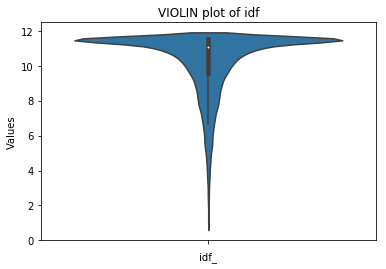

In [0]:
sns.violinplot(x = "Values",data=tfidf_df,orient="v")
plt.xlabel("idf_")
plt.title("VIOLIN plot of idf")

Text(0.5, 1.0, 'BOXEN plot of idf')

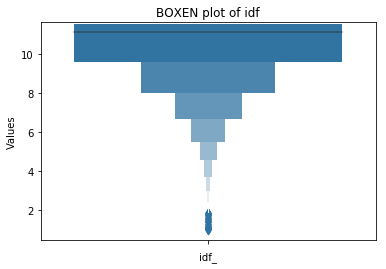

In [0]:
sns.boxenplot(x = "Values",data=tfidf_df,orient="v")
plt.xlabel("idf_")
plt.title("BOXEN plot of idf")

Text(0.5, 1.0, 'BOX plot of idf')

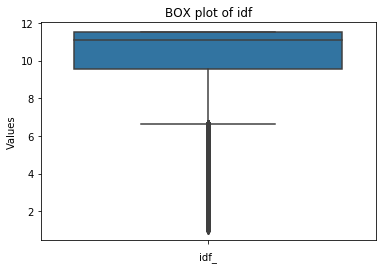

In [0]:
sns.boxplot(x = "Values",data=tfidf_df,orient="v")
plt.xlabel("idf_")
plt.title("BOX plot of idf")

In [0]:
print("\n25th Percentile")
print(np.percentile(tfidf_df['Values'],1))
print("\n27th Percentiles")
print(np.percentile(tfidf_df['Values'],27))


25th Percentile
3.983908779165195

27th Percentiles
9.716003065714995


In [0]:
tfidf_fil = tfidf_df[(tfidf_df["Values"] >=  2) & (tfidf_df["Values"] <=  11)]

Text(0.5, 1.0, 'VIOLIN plot of idf')

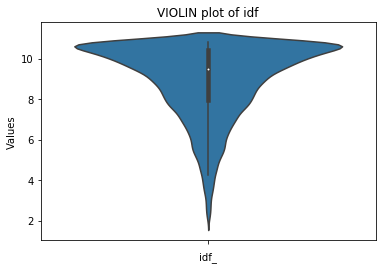

In [0]:
sns.violinplot(x = "Values",data=tfidf_fil,orient="v")
plt.xlabel("idf_")
plt.title("VIOLIN plot of idf")

In [0]:
fil_words = tfidf_fil["Words"].tolist()

In [0]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(fil_words)
seq_train = tokenizer.texts_to_sequences(X_train["essay"])
seq_test = tokenizer.texts_to_sequences(X_test["essay"])

In [0]:
vocab_size = len(tokenizer.word_index) + 1

In [0]:
padded_train = pad_sequences(seq_train,maxlen=100)
padded_test = pad_sequences(seq_test, maxlen=100)

In [0]:
pickle_in = open("/content/drive/My Drive/AAIC/Assignments/glove_vectors","rb")
glove_words = pickle.load(pickle_in)

In [0]:
embedding_matrix = zeros((vocab_size, 300))
for word, i in tokenizer.word_index.items():
    embedding_vector = glove_words.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

In [0]:
print(embedding_matrix.shape)

(25199, 300)


In [0]:
# input_text = Input(shape=(800,),name="input_text")
embedding_layer = Embedding(vocab_size,300,weights=[embedding_matrix],input_length=100,trainable=False)
input_text = Input(shape=(100,),name="input_text")
x = embedding_layer(input_text)
x = LSTM(256,recurrent_dropout=0.5,kernel_regularizer=regularizers.l2(0.001),return_sequences=True)(x)
flat_1 = Flatten()(x)






Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [0]:
X_train.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'project_submitted_datetime', 'project_title',
       'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'clean_categories',
       'clean_subcategories', 'essay', 'price', 'quantity',
       'digits_in_summary', 'clean_project_grade_category',
       'preprocessed_essays', 'preprocessed_titles'],
      dtype='object')

In [0]:
vect = CountVectorizer(binary=True)
vect.fit(X_train["teacher_prefix"])
train_prefix = vect.transform(X_train["teacher_prefix"])
test_prefix = vect.transform(X_test["teacher_prefix"])

In [0]:
vect = CountVectorizer(binary=True)
vect.fit(X_train["school_state"])
train_state = vect.transform(X_train["school_state"])
test_state = vect.transform(X_test["school_state"])

In [0]:
vect = CountVectorizer(binary=True)
vect.fit(X_train["clean_project_grade_category"])
train_grade = vect.transform(X_train["clean_project_grade_category"])
test_grade = vect.transform(X_test["clean_project_grade_category"])

In [0]:
vect = CountVectorizer(binary=True)
vect.fit(X_train["clean_categories"])
train_subcat = vect.transform(X_train["clean_categories"])
test_subcat = vect.transform(X_test["clean_categories"])

In [0]:
vect = CountVectorizer(binary=True)
vect.fit(X_train["clean_subcategories"])
train_subcat_1 = vect.transform(X_train["clean_subcategories"])
test_subcat_1 = vect.transform(X_test["clean_subcategories"])

In [0]:
numerical_train_a=X_train['digits_in_summary'].values.reshape(-1, 1)
numerical_train_b=X_train['price'].values.reshape(-1, 1)
numerical_train_c=X_train['quantity'].values.reshape(-1, 1)
numerical_train_d=X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1)
numerical_test_a=X_test['digits_in_summary'].values.reshape(-1, 1)
numerical_test_b=X_test['price'].values.reshape(-1, 1)
numerical_test_c=X_test['quantity'].values.reshape(-1, 1)
numerical_test_d=X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1, 1)
numerical_train=np.concatenate((numerical_train_a,numerical_train_b,numerical_train_c,numerical_train_d),axis=1)
numerical_test=np.concatenate((numerical_test_a,numerical_test_b,numerical_test_c,numerical_test_d),axis=1)

from sklearn.preprocessing import StandardScaler
normal=StandardScaler()
normal_train=normal.fit_transform(numerical_train)
normal_test=normal.transform(numerical_test)

In [0]:
from scipy.sparse import hstack
ot_train = hstack([train_prefix,train_state,train_grade,train_subcat,train_subcat_1]).todense()
ot_test = hstack([test_prefix,test_state,test_grade,test_subcat,test_subcat_1]).todense()
ot_all_train = np.hstack((ot_train,normal_train))
ot_all_test = np.hstack((ot_test,normal_test))
ot_train_all = np.expand_dims(ot_all_train,2)
ot_test_all = np.expand_dims(ot_all_test,2)

In [0]:
inp_conv=Input(shape=(104, 1))
x1 = Conv1D(filters=128, kernel_size=3, activation='relu',kernel_initializer="he_normal")(inp_conv)
x1 = Conv1D(filters=128, kernel_size=3, activation='relu',kernel_initializer="he_normal")(x1)
x1 = Flatten()(x1)

In [0]:
x_concatenate = concatenate([flat_1,x1])
x = Dense(128,activation="relu",kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(x_concatenate)
x=Dropout(0.5)(x)
x = Dense(64,activation="relu",kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(x)
x=Dropout(0.3)(x)
x = Dense(32,activation="relu",kernel_initializer="he_normal",kernel_regularizer=regularizers.l2(0.001))(x)
output = Dense(2, activation='softmax', name='output')(x)
model_1 = Model(inputs=[input_text,inp_conv],outputs=[output])

In [0]:
train_data_3 = [padded_train,ot_train_all]
test_data_3 = [padded_test,ot_test_all]
from keras.utils import np_utils
Y_train = np_utils.to_categorical(y_train, 2) 
Y_test = np_utils.to_categorical(y_test, 2)

In [0]:
from sklearn.metrics import roc_auc_score
def auc1(y_true, y_pred):
    if len(np.unique(y_true[:,1])) == 1:
        return 0.5
    else:
        return roc_auc_score(y_true, y_pred)
def auroc(y_true, y_pred):
    return tf.py_func(auc1, (y_true, y_pred), tf.double)

In [0]:
model_1.compile(optimizer=Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False), loss='categorical_crossentropy', metrics=[auroc])


Instructions for updating:
tf.py_func is deprecated in TF V2. Instead, there are two
    options available in V2.
    - tf.py_function takes a python function which manipulates tf eager
    tensors instead of numpy arrays. It's easy to convert a tf eager tensor to
    an ndarray (just call tensor.numpy()) but having access to eager tensors
    means `tf.py_function`s can use accelerators such as GPUs as well as
    being differentiable using a gradient tape.
    - tf.numpy_function maintains the semantics of the deprecated tf.py_func
    (it is not differentiable, and manipulates numpy arrays). It drops the
    stateful argument making all functions stateful.
    


In [0]:
checkpoint_3 = ModelCheckpoint("model_3.h5",monitor="val_auroc",mode="max",save_best_only = True,verbose=1)
NAME = 'model_3'
tensorboard_2 = TensorBoard(log_dir='logss\{}'.format(NAME),update_freq='epoch',batch_size=512)
callbacks_2 = [tensorboard_2,checkpoint_3]

In [0]:
# from tensorflow.keras.callbacks import TensorBoard
# import time

# # NAME = 'cc-{}'.format(int(time.time()))
# # tensorboardd = TensorBoard(log_dir='C:\Users\LENOVO\Desktop\applidai\AAIC\logss\\')
# NAME = 'model_2'
# tensorboardd = TensorBoard(log_dir='logss\{}'.format(NAME),update_freq='epoch',batch_size=320)
# # tensorboard_1 = TensorBoard(log_dir='logss\{}'.format(NAME), histogram_freq=0, batch_size=320, write_graph=True, write_grads=False, write_images=False, embeddings_freq=0, embeddings_layer_names=None, embeddings_metadata=None, embeddings_data=None, update_freq='epoch')

In [0]:
history_1 = model_1.fit(train_data_3,Y_train,batch_size=512,epochs=15,validation_data=(test_data_3,Y_test),verbose=1,callbacks=callbacks_2)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Train on 73196 samples, validate on 36052 samples


Epoch 1/15
73196/73196 [==============================] - 34s 465us/step - loss: 0.8525 - auroc: 0.6541 - val_loss: 0.5935 - val_auroc: 0.7265

Epoch 00001: val_auroc improved from -inf to 0.72653, saving model to model_3.h5
Epoch 2/15
73196/73196 [==============================] - 29s 397us/step - loss: 0.5369 - auroc: 0.7251 - val_loss: 0.4977 - val_auroc: 0.7360

Epoch 00002: val_auroc improved from 0.72653 to 0.73605, saving model to model_3.h5
Epoch 3/15
73196/73196 [==============================] - 29s 400us/step - loss: 0.4744 - auroc: 0.7381 - val_loss: 0.4664 - val_auroc: 0.7410

Epoch 00003: val_auroc improved from 0.73605 to 0.74100, saving model to model_3.h5
Epoch 4/15
73196/73196 [==============================] - 29s 400us/step - loss: 0.4455 - auroc: 0.7463 - val_loss: 0.4413 - val_auroc: 0.7435

Epoch 00004: val_auroc improv

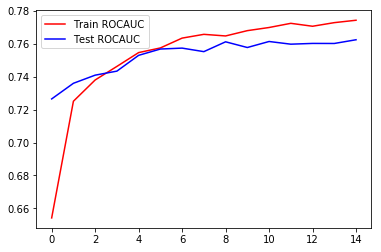

In [0]:
plt.plot(history_1.history['auroc'], 'r')
plt.plot(history_1.history['val_auroc'], 'b')
plt.legend({'Train ROCAUC': 'r', 'Test ROCAUC':'b'})
plt.show()

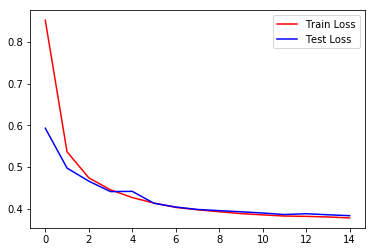

In [0]:
plt.plot(history_1.history['loss'], 'r')
plt.plot(history_1.history['val_loss'], 'b')
plt.legend({'Train Loss': 'r', 'Test Loss':'b'})
plt.show()

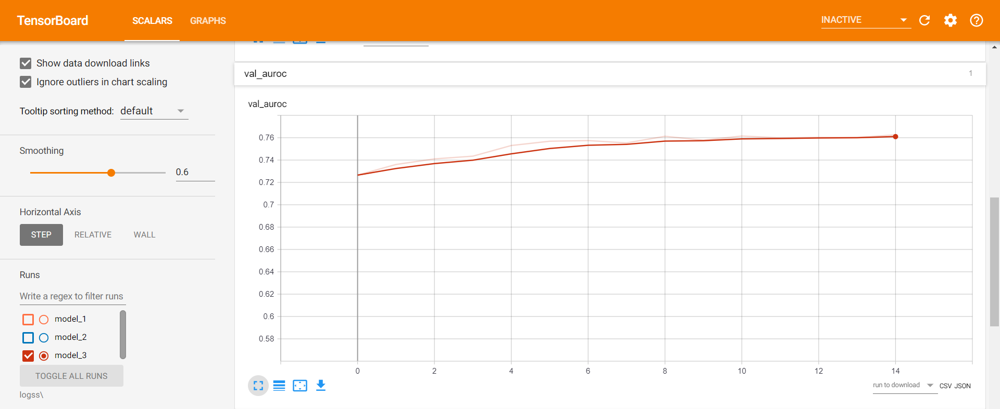

In [5]:
from IPython.display import Image
Image("model3auc.png")

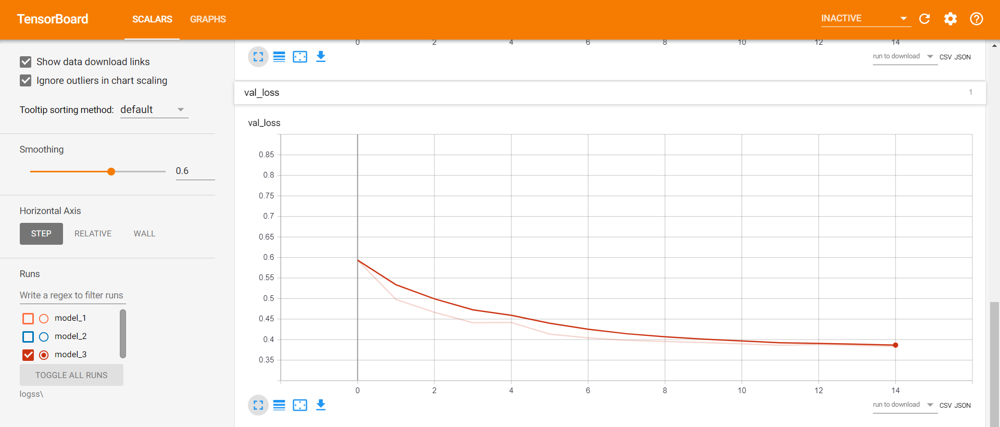

In [6]:
from IPython.display import Image
Image("model3loss.png")

### Finally For Model-3 , i'm able to get above 0.76 which is best among all the models

In [7]:
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Model","Description", "Test loss", "Test AUC"]
x.add_row(["1","On all text data","0.4266", "0.7545"])
x.add_row(["2","On filtered data by idf values","0.4205", "0.7310"])
x.add_row(["3","On filtered data by idf values with ConvNets","0.3834", "0.7625"])
print(x)

+-------+----------------------------------------------+-----------+----------+
| Model |                 Description                  | Test loss | Test AUC |
+-------+----------------------------------------------+-----------+----------+
|   1   |               On all text data               |   0.4266  |  0.7545  |
|   2   |        On filtered data by idf values        |   0.4205  |  0.7310  |
|   3   | On filtered data by idf values with ConvNets |   0.3834  |  0.7625  |
+-------+----------------------------------------------+-----------+----------+
